In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
import numpy as np
import os
import cv2
from PIL import Image
from scipy.io import loadmat
import matplotlib.pyplot as plt
import torch.nn.functional as F



In [23]:
class MCNN(nn.Module):
    def __init__(self):
        super(MCNN, self).__init__()
        self.branch1 = nn.Sequential(
            nn.Conv2d(3, 16, 9, padding=4), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(16, 32, 7, padding=3), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 16, 7, padding=3), nn.ReLU(),
            nn.Conv2d(16, 8, 7, padding=3), nn.ReLU()
        )
        self.branch2 = nn.Sequential(
            nn.Conv2d(3, 20, 7, padding=3), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(20, 40, 5, padding=2), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(40, 20, 5, padding=2), nn.ReLU(),
            nn.Conv2d(20, 10, 5, padding=2), nn.ReLU()
        )
        self.branch3 = nn.Sequential(
            nn.Conv2d(3, 24, 5, padding=2), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(24, 48, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(48, 24, 3, padding=1), nn.ReLU(),
            nn.Conv2d(24, 12, 3, padding=1), nn.ReLU()
        )
        self.fuse = nn.Conv2d(8 + 10 + 12, 1, 1)

    def forward(self, x):
        x1 = self.branch1(x)
        x2 = self.branch2(x)
        x3 = self.branch3(x)
        return self.fuse(torch.cat((x1, x2, x3), dim=1))


In [24]:
class ShanghaiTechCrowdCountingDataset(Dataset):
    def __init__(self, image_dir, gt_dir, transform=None, img_size=(64, 64)):
        self.image_dir = image_dir
        self.gt_dir = gt_dir
        self.transform = transform
        self.img_size = img_size
        self.image_files = sorted(os.listdir(image_dir))
        self.gt_files = sorted(os.listdir(gt_dir))

    def __len__(self):
        return len(self.image_files)

    def generate_density_map(self, img, coordinates):
        density_map = np.zeros(img.shape[:2], dtype=np.float32)
        kernel_size = 15
        sigma = 4.0
        for coord in coordinates:
            x, y = int(coord[0]), int(coord[1])
            gaussian_kernel = self.create_gaussian_kernel(kernel_size, sigma)
            x_min = max(x - kernel_size // 2, 0)
            y_min = max(y - kernel_size // 2, 0)
            x_max = min(x + kernel_size // 2, img.shape[1])
            y_max = min(y + kernel_size // 2, img.shape[0])
            if x_max > x_min and y_max > y_min:
                density_map[y_min:y_max, x_min:x_max] += gaussian_kernel[:y_max - y_min, :x_max - x_min]
        return np.clip(density_map, 0, 255)

    def create_gaussian_kernel(self, kernel_size, sigma):
        ax = np.linspace(-(kernel_size // 2), kernel_size // 2, kernel_size)
        xx, yy = np.meshgrid(ax, ax)
        kernel = np.exp(-(xx**2 + yy**2) / (2 * sigma**2))
        return kernel / np.sum(kernel)

    def __getitem__(self, idx):
        image_path = os.path.join(self.image_dir, self.image_files[idx])
        gt_path = os.path.join(self.gt_dir, self.gt_files[idx])
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mat_data = loadmat(gt_path)
        coordinates = mat_data['image_info'][0, 0]['location'][0, 0]
        density_map = self.generate_density_map(image, coordinates)
        image = cv2.resize(image, self.img_size)
        density_map = cv2.resize(density_map, self.img_size)
        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)
        density_map = torch.tensor(density_map, dtype=torch.float32).unsqueeze(0)
        return image, density_map


In [25]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

train_dataset = ShanghaiTechCrowdCountingDataset(
    image_dir='ShanghaiTech/part_B_final/train_data/images',
    gt_dir='ShanghaiTech/part_B_final/train_data/ground_truth',
    transform=transform
)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)

test_dataset = ShanghaiTechCrowdCountingDataset(
    image_dir='ShanghaiTech/part_B_final/test_data/images',
    gt_dir='ShanghaiTech/part_B_final/test_data/ground_truth',
    transform=transform
)

test_loader = DataLoader(test_dataset, batch_size=4, shuffle=True)



In [26]:
def count_people_from_density(density_map):
    return float(density_map.sum().item())


In [27]:
def plot(img, gt, pred):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img.permute(1, 2, 0).cpu().numpy())
    plt.title("Input Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(gt.squeeze().cpu(), cmap='jet')
    plt.title(f"Ground Truth: {gt.sum().item():.1f} People")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(pred.squeeze(), cmap='jet')
    plt.title(f"Predicted: {pred.sum():.1f} People")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [28]:
import matplotlib.pyplot as plt

def visualize_counting_result(image, gt_map, pred_map, gt_count, pred_count):
    """
    Plots the input image, ground truth density map, and predicted density map.
    Also displays the true and predicted crowd counts.
    """
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    axs[0].imshow(image.permute(1, 2, 0).cpu())  # Tensor CHW to HWC
    axs[0].set_title("Input Image")
    axs[0].axis('off')

    axs[1].imshow(gt_map.squeeze().cpu(), cmap='jet')
    axs[1].set_title(f"GT Count: {gt_count:.1f}")
    axs[1].axis('off')

    axs[2].imshow(pred_map.squeeze().detach().cpu(), cmap='jet')
    axs[2].set_title(f"Predicted Count: {pred_count:.1f}")
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.64].


Epoch 1: Loss = 0.0005


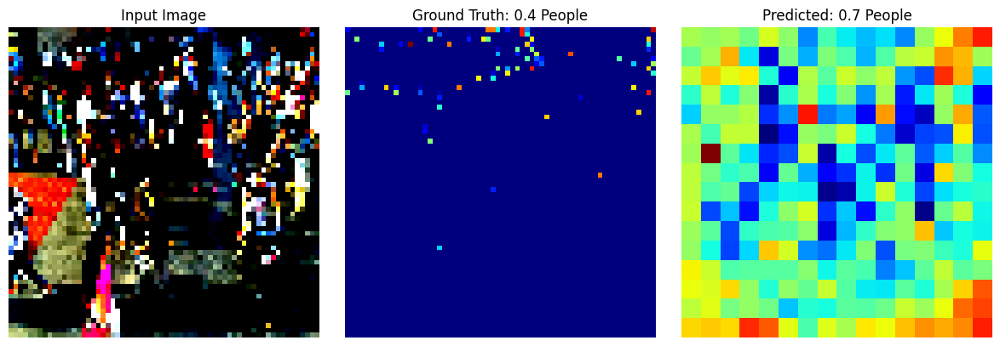

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0322802..2.64].


Epoch 2: Loss = 0.0002


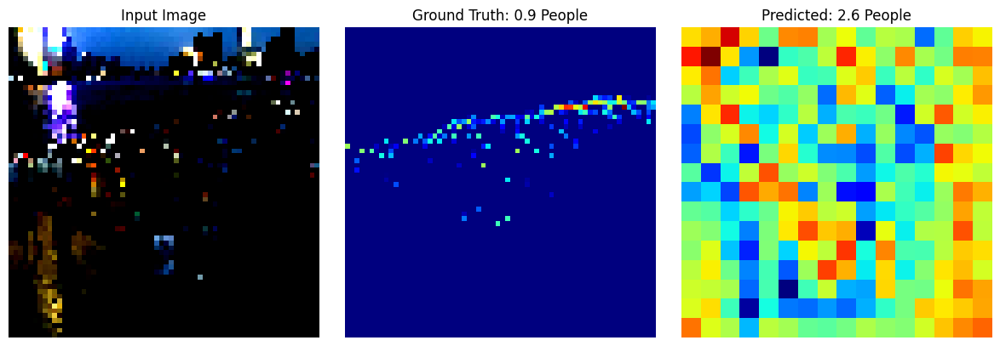

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.64].


Epoch 3: Loss = 0.0001


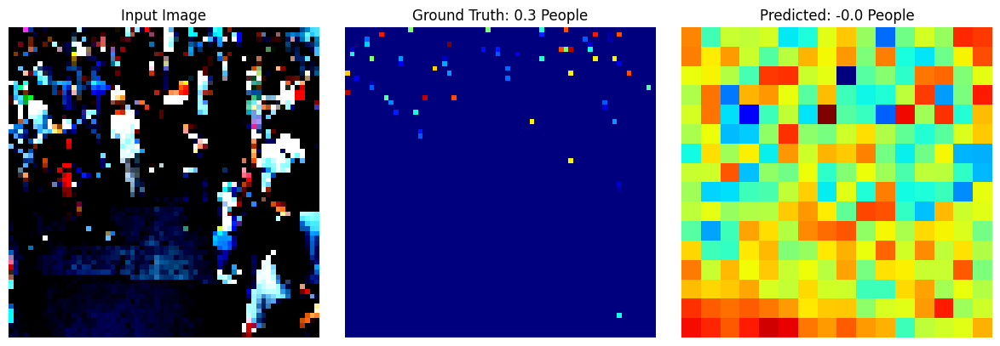

KeyboardInterrupt: 

In [29]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MCNN().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-5)

for epoch in range(10):
    model.train()
    total_loss = 0
    for imgs, gt_maps in train_loader:
        imgs, gt_maps = imgs.to(device), gt_maps.to(device)
        preds = model(imgs)
        if preds.shape != gt_maps.shape:
            preds = F.interpolate(preds, size=gt_maps.shape[2:], mode='bilinear', align_corners=False)

        loss = criterion(preds, gt_maps)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}: Loss = {total_loss / len(train_loader):.4f}")

    model.eval()
    with torch.no_grad():
        sample_img, sample_gt = next(iter(train_loader))
        sample_img, sample_gt = sample_img.to(device), sample_gt.to(device)
        pred_map = model(sample_img)
        plot(sample_img[0], sample_gt[0], pred_map[0].cpu())


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.9124069..2.64].


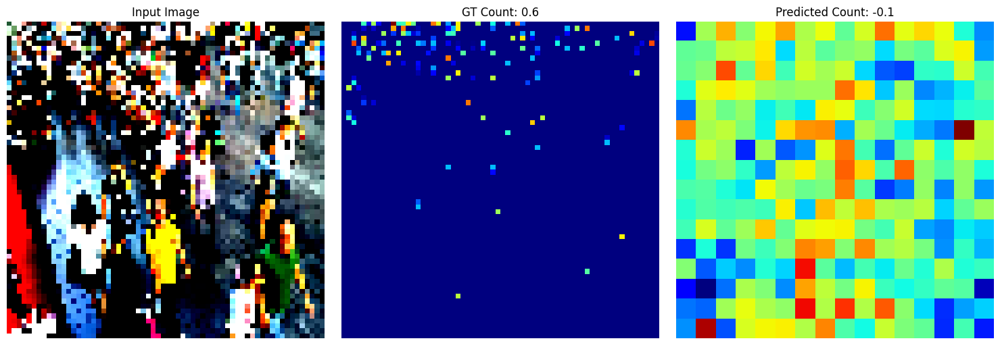

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0665298..2.64].


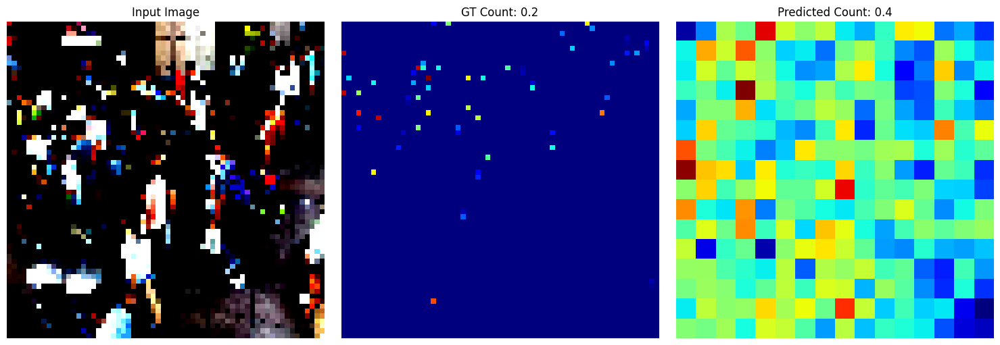

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..2.64].


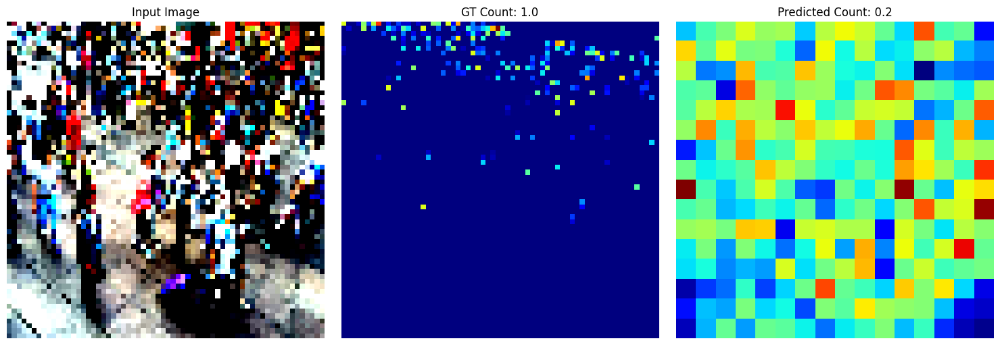

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0494049..2.64].


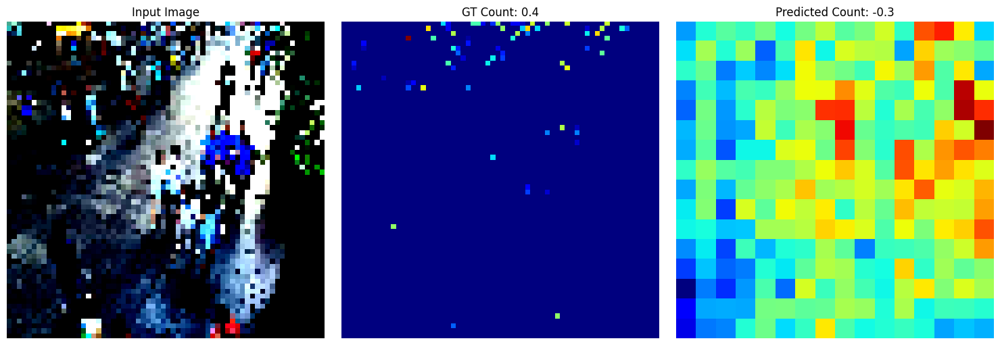

In [ ]:
model.eval()
with torch.no_grad():
    for imgs, gt_maps in test_loader:
        imgs, gt_maps = imgs.to(device), gt_maps.to(device)

        preds = model(imgs)

        for i in range(len(imgs)):
            gt_count = count_people_from_density(gt_maps[i])
            pred_count = count_people_from_density(preds[i])
            visualize_counting_result(imgs[i], gt_maps[i], preds[i], gt_count, pred_count)
        break  # Remove if you want to visualize more batches


Epoch [1/20] Batch [0/100] Loss: 0.0007 GT counts: [ 14.836905 179.0563    36.367462  53.471565] Pred counts: [1060.3267 1415.8826 1147.9398 1348.8264]
Epoch [1/20] Batch [10/100] Loss: 0.0002 GT counts: [ 82.34194   60.838333 343.6961   144.09352 ] Pred counts: [0.         0.         0.06021369 0.        ]
Epoch [1/20] Batch [20/100] Loss: 0.0002 GT counts: [ 27.58148 270.81485 187.15723 122.41255] Pred counts: [0. 0. 0. 0.]
Epoch [1/20] Batch [30/100] Loss: 0.0002 GT counts: [ 54.050667 270.06824   56.60124   13.728863] Pred counts: [0. 0. 0. 0.]
Epoch [1/20] Batch [40/100] Loss: 0.0006 GT counts: [412.74057  26.47157 343.74368  32.53354] Pred counts: [0. 0. 0. 0.]
Epoch [1/20] Batch [50/100] Loss: 0.0003 GT counts: [ 27.810734 149.7842   298.9778    53.236298] Pred counts: [0. 0. 0. 0.]
Epoch [1/20] Batch [60/100] Loss: 0.0000 GT counts: [29.500172 49.602623 43.88151  78.909775] Pred counts: [0. 0. 0. 0.]
Epoch [1/20] Batch [70/100] Loss: 0.0001 GT counts: [ 53.475357 177.23189   17

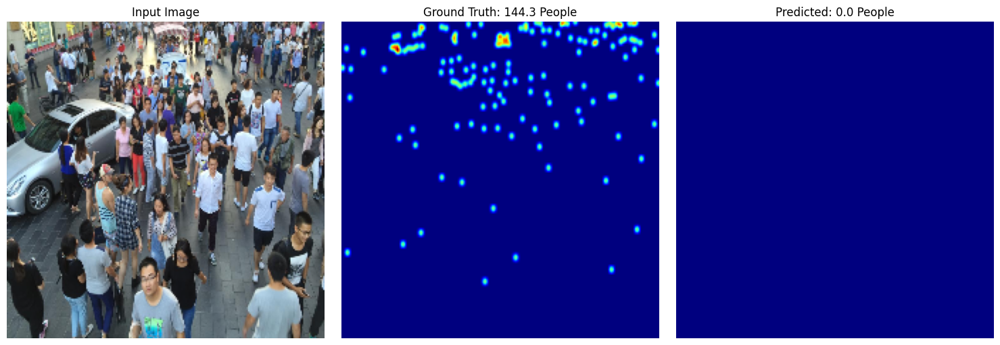

Epoch [2/20] Batch [0/100] Loss: 0.0001 GT counts: [ 66.173706  44.482567  35.667934 167.64783 ] Pred counts: [0. 0. 0. 0.]
Epoch [2/20] Batch [10/100] Loss: 0.0001 GT counts: [118.87802   28.599224  66.409325  22.643677] Pred counts: [0. 0. 0. 0.]
Epoch [2/20] Batch [20/100] Loss: 0.0001 GT counts: [117.19713   69.52156   32.835396  14.836905] Pred counts: [0. 0. 0. 0.]
Epoch [2/20] Batch [30/100] Loss: 0.0001 GT counts: [45.74123  24.900436 80.15835  82.34194 ] Pred counts: [0. 0. 0. 0.]
Epoch [2/20] Batch [40/100] Loss: 0.0002 GT counts: [ 92.35977  144.09352  249.42514   30.280891] Pred counts: [0. 0. 0. 0.]
Epoch [2/20] Batch [50/100] Loss: 0.0002 GT counts: [ 24.979347 194.37933  113.37622   85.43908 ] Pred counts: [0. 0. 0. 0.]
Epoch [2/20] Batch [60/100] Loss: 0.0004 GT counts: [ 97.0932   172.95999  412.74057   52.817616] Pred counts: [0. 0. 0. 0.]
Epoch [2/20] Batch [70/100] Loss: 0.0002 GT counts: [ 36.489258 348.89456   41.99066  132.65149 ] Pred counts: [0. 0. 0. 0.]
Epoch

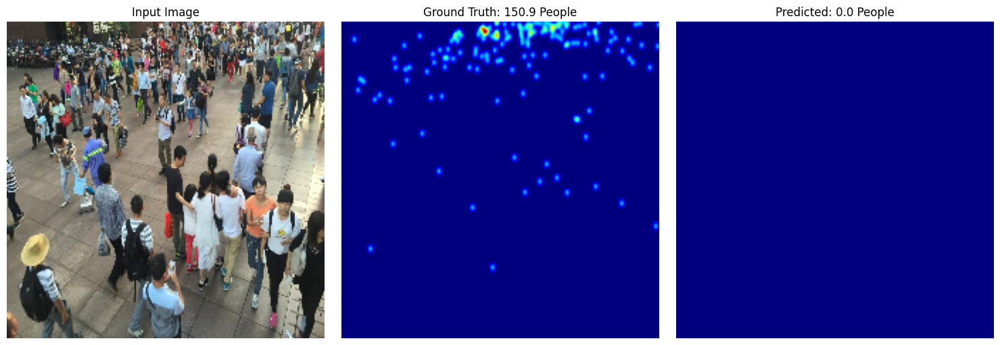

Epoch [3/20] Batch [0/100] Loss: 0.0005 GT counts: [279.29944  412.74057   30.826586 200.55695 ] Pred counts: [0. 0. 0. 0.]
Epoch [3/20] Batch [10/100] Loss: 0.0001 GT counts: [ 41.99066  103.01509  112.21522   26.781643] Pred counts: [0. 0. 0. 0.]
Epoch [3/20] Batch [20/100] Loss: 0.0000 GT counts: [26.035862 45.652954 87.90835  60.518486] Pred counts: [0. 0. 0. 0.]
Epoch [3/20] Batch [30/100] Loss: 0.0001 GT counts: [ 58.510963 180.76338  115.70012   52.817616] Pred counts: [0. 0. 0. 0.]
Epoch [3/20] Batch [40/100] Loss: 0.0001 GT counts: [ 48.78608 102.90979  78.64228 135.55458] Pred counts: [0. 0. 0. 0.]
Epoch [3/20] Batch [50/100] Loss: 0.0001 GT counts: [115.61615  246.11453   19.513012 110.38676 ] Pred counts: [0. 0. 0. 0.]
Epoch [3/20] Batch [60/100] Loss: 0.0001 GT counts: [33.061234 49.52013  81.385376 72.30767 ] Pred counts: [0. 0. 0. 0.]
Epoch [3/20] Batch [70/100] Loss: 0.0001 GT counts: [ 86.08925   20.638638  60.874817 187.15723 ] Pred counts: [0. 0. 0. 0.]
Epoch [3/20] 

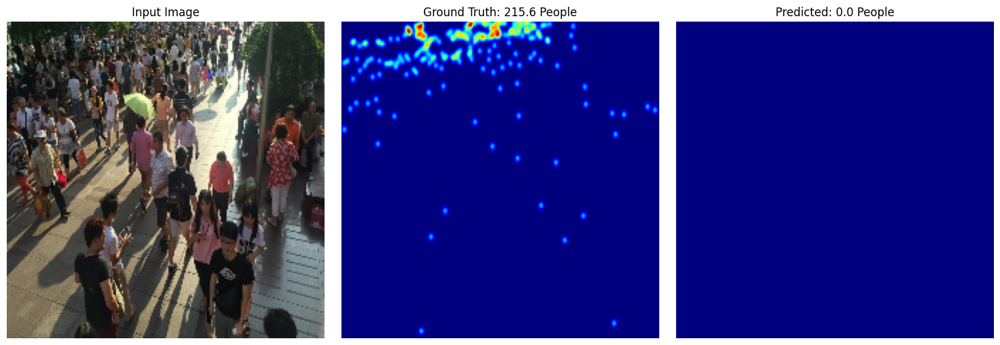

Epoch [4/20] Batch [0/100] Loss: 0.0002 GT counts: [232.46078 100.68945  56.60124 125.30975] Pred counts: [0. 0. 0. 0.]
Epoch [4/20] Batch [10/100] Loss: 0.0000 GT counts: [26.035862 58.       26.971767 33.819553] Pred counts: [0. 0. 0. 0.]
Epoch [4/20] Batch [20/100] Loss: 0.0001 GT counts: [113.37622   42.83293  159.02016   21.742722] Pred counts: [0. 0. 0. 0.]
Epoch [4/20] Batch [30/100] Loss: 0.0001 GT counts: [ 25.279913 163.67438   24.900436  79.513016] Pred counts: [0. 0. 0. 0.]
Epoch [4/20] Batch [40/100] Loss: 0.0002 GT counts: [215.58269  114.        53.471565 137.1046  ] Pred counts: [0. 0. 0. 0.]
Epoch [4/20] Batch [50/100] Loss: 0.0003 GT counts: [148.31583 200.06914  97.81622 249.42514] Pred counts: [0. 0. 0. 0.]
Epoch [4/20] Batch [60/100] Loss: 0.0001 GT counts: [ 65.97162  26.12001  78.64228 188.79764] Pred counts: [0. 0. 0. 0.]
Epoch [4/20] Batch [70/100] Loss: 0.0002 GT counts: [ 78.71812   27.673243 148.16379  149.7842  ] Pred counts: [0. 0. 0. 0.]
Epoch [4/20] Batc

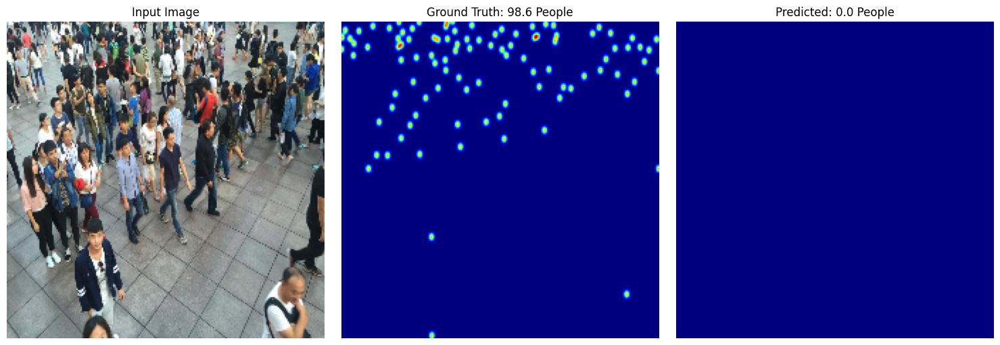

Epoch [5/20] Batch [0/100] Loss: 0.0001 GT counts: [ 37.632088 194.37933  138.17332   97.0932  ] Pred counts: [0. 0. 0. 0.]
Epoch [5/20] Batch [10/100] Loss: 0.0001 GT counts: [160.62996  106.533844  53.5202    56.600555] Pred counts: [0. 0. 0. 0.]
Epoch [5/20] Batch [20/100] Loss: 0.0005 GT counts: [123.27171 298.9764  132.27592 396.53613] Pred counts: [0. 0. 0. 0.]
Epoch [5/20] Batch [30/100] Loss: 0.0002 GT counts: [159.02016 103.02994 242.09637 150.70013] Pred counts: [0. 0. 0. 0.]
Epoch [5/20] Batch [40/100] Loss: 0.0003 GT counts: [261.3097  270.81485 122.41255 125.30975] Pred counts: [0. 0. 0. 0.]
Epoch [5/20] Batch [50/100] Loss: 0.0001 GT counts: [150.92142   58.        32.53354   36.367462] Pred counts: [0. 0. 0. 0.]
Epoch [5/20] Batch [60/100] Loss: 0.0001 GT counts: [ 86.08925   87.90835  136.06485   30.826586] Pred counts: [0. 0. 0. 0.]
Epoch [5/20] Batch [70/100] Loss: 0.0001 GT counts: [93.707306 28.347343 92.92765  26.719517] Pred counts: [0. 0. 0. 0.]
Epoch [5/20] Batc

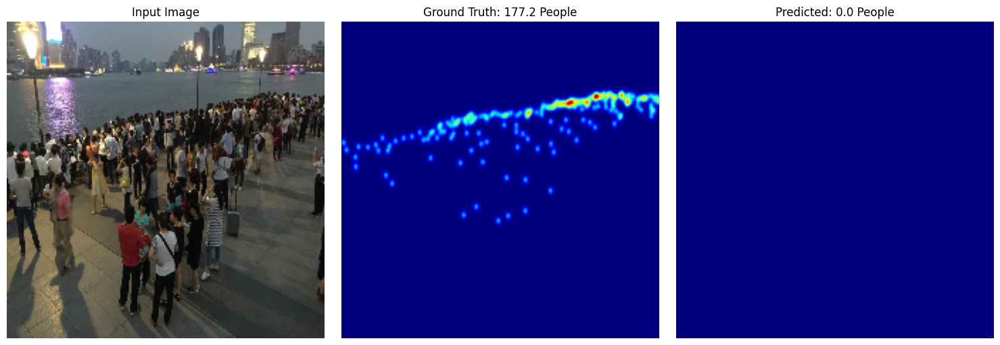

Epoch [6/20] Batch [0/100] Loss: 0.0001 GT counts: [108.21273   30.504005  31.938618  76.18249 ] Pred counts: [0. 0. 0. 0.]
Epoch [6/20] Batch [10/100] Loss: 0.0001 GT counts: [105.84036   32.704117  29.58704  105.79604 ] Pred counts: [0. 0. 0. 0.]
Epoch [6/20] Batch [20/100] Loss: 0.0001 GT counts: [159.54523   20.638638  26.59269   52.585274] Pred counts: [0. 0. 0. 0.]
Epoch [6/20] Batch [30/100] Loss: 0.0001 GT counts: [ 41.96058  105.29033   87.536835  51.770466] Pred counts: [0. 0. 0. 0.]
Epoch [6/20] Batch [40/100] Loss: 0.0002 GT counts: [167.64783   82.34194  293.93198   45.752422] Pred counts: [0. 0. 0. 0.]
Epoch [6/20] Batch [50/100] Loss: 0.0005 GT counts: [ 60.874817  52.54609   23.       555.77905 ] Pred counts: [0. 0. 0. 0.]
Epoch [6/20] Batch [60/100] Loss: 0.0000 GT counts: [24.979347 91.587524 66.173706 26.12001 ] Pred counts: [0. 0. 0. 0.]
Epoch [6/20] Batch [70/100] Loss: 0.0001 GT counts: [ 47.50782   79.76195  208.16443   26.719517] Pred counts: [0. 0. 0. 0.]
Epoch

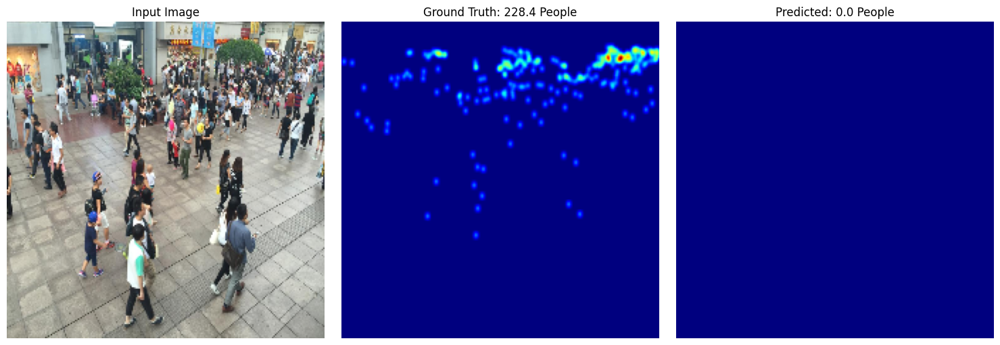

Epoch [7/20] Batch [0/100] Loss: 0.0001 GT counts: [ 53.475357 148.16379   53.236298 170.30629 ] Pred counts: [0. 0. 0. 0.]
Epoch [7/20] Batch [10/100] Loss: 0.0002 GT counts: [106.60312 200.55695 116.65566 157.     ] Pred counts: [0. 0. 0. 0.]
Epoch [7/20] Batch [20/100] Loss: 0.0001 GT counts: [ 52.66703 209.84383 160.6897   86.22612] Pred counts: [0. 0. 0. 0.]
Epoch [7/20] Batch [30/100] Loss: 0.0002 GT counts: [ 86.46951 221.37207 135.55458 187.00049] Pred counts: [0. 0. 0. 0.]
Epoch [7/20] Batch [40/100] Loss: 0.0001 GT counts: [201.93651   56.600555 143.76233   21.742722] Pred counts: [0. 0. 0. 0.]
Epoch [7/20] Batch [50/100] Loss: 0.0001 GT counts: [ 98.55904  43.88151 130.8227  159.02016] Pred counts: [0. 0. 0. 0.]
Epoch [7/20] Batch [60/100] Loss: 0.0001 GT counts: [ 91.10643   36.489258  25.39045  138.17332 ] Pred counts: [0. 0. 0. 0.]
Epoch [7/20] Batch [70/100] Loss: 0.0001 GT counts: [ 24.577068  67.660736 167.64783   31.72886 ] Pred counts: [0. 0. 0. 0.]
Epoch [7/20] Batc

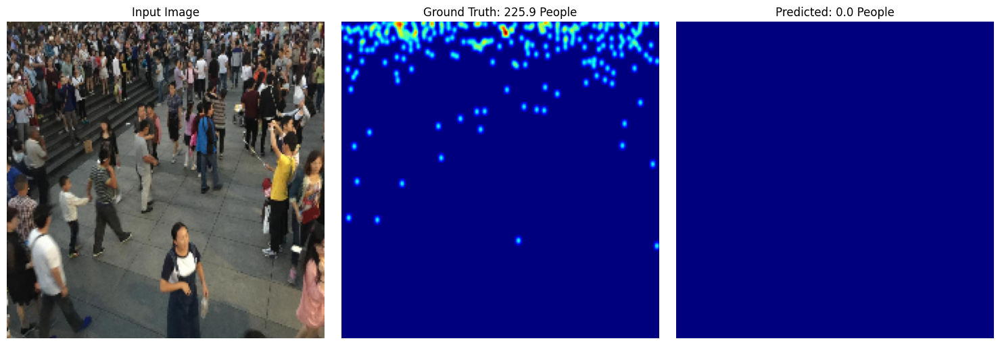

Epoch [8/20] Batch [0/100] Loss: 0.0001 GT counts: [ 15.51301   34.46187   29.331478 199.53778 ] Pred counts: [0. 0. 0. 0.]
Epoch [8/20] Batch [10/100] Loss: 0.0002 GT counts: [ 56.60124 160.62996 211.37823 183.48322] Pred counts: [0. 0. 0. 0.]
Epoch [8/20] Batch [20/100] Loss: 0.0004 GT counts: [166.7854  113.23535 345.10327 259.95728] Pred counts: [0. 0. 0. 0.]
Epoch [8/20] Batch [30/100] Loss: 0.0003 GT counts: [157.        21.742722  85.43908  298.9778  ] Pred counts: [0. 0. 0. 0.]
Epoch [8/20] Batch [40/100] Loss: 0.0001 GT counts: [140.70578   34.309174 143.76233   48.78608 ] Pred counts: [0. 0. 0. 0.]
Epoch [8/20] Batch [50/100] Loss: 0.0001 GT counts: [215.58269   58.        28.599224  13.728863] Pred counts: [0. 0. 0. 0.]
Epoch [8/20] Batch [60/100] Loss: 0.0002 GT counts: [144.74026   61.39896  279.29944   56.600555] Pred counts: [0. 0. 0. 0.]
Epoch [8/20] Batch [70/100] Loss: 0.0000 GT counts: [34.214237 45.74123  14.520541 42.83293 ] Pred counts: [0. 0. 0. 0.]
Epoch [8/20] 

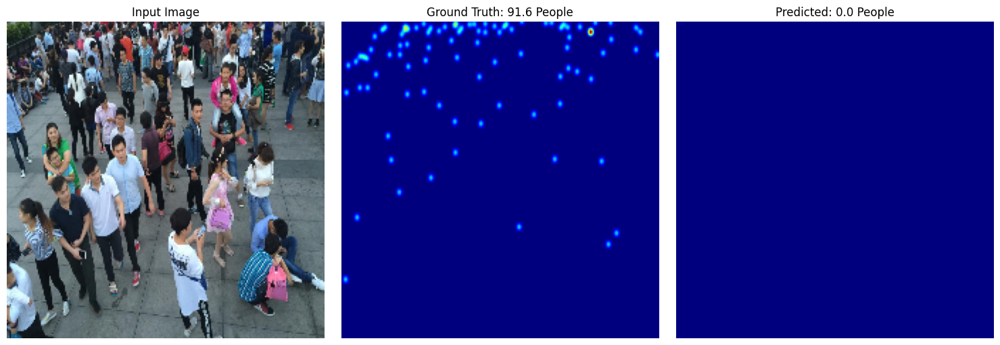

Epoch [9/20] Batch [0/100] Loss: 0.0001 GT counts: [ 94.74024 209.11908  31.78418  83.11659] Pred counts: [0. 0. 0. 0.]
Epoch [9/20] Batch [10/100] Loss: 0.0001 GT counts: [26.47157  44.482567 80.10183  91.10643 ] Pred counts: [0. 0. 0. 0.]
Epoch [9/20] Batch [20/100] Loss: 0.0001 GT counts: [ 29.58704   42.83293   53.236298 106.60312 ] Pred counts: [0. 0. 0. 0.]
Epoch [9/20] Batch [30/100] Loss: 0.0002 GT counts: [ 97.0932   109.87633   28.599224 295.96805 ] Pred counts: [0. 0. 0. 0.]
Epoch [9/20] Batch [40/100] Loss: 0.0003 GT counts: [279.0169  128.39958 201.93651 137.1046 ] Pred counts: [0. 0. 0. 0.]
Epoch [9/20] Batch [50/100] Loss: 0.0001 GT counts: [170.30629   52.817616  78.909775 111.4709  ] Pred counts: [0. 0. 0. 0.]
Epoch [9/20] Batch [60/100] Loss: 0.0001 GT counts: [140.70578  135.55458   85.9339    14.836905] Pred counts: [0. 0. 0. 0.]
Epoch [9/20] Batch [70/100] Loss: 0.0003 GT counts: [ 42.622818 187.00049  157.       270.81485 ] Pred counts: [0. 0. 0. 0.]
Epoch [9/20] 

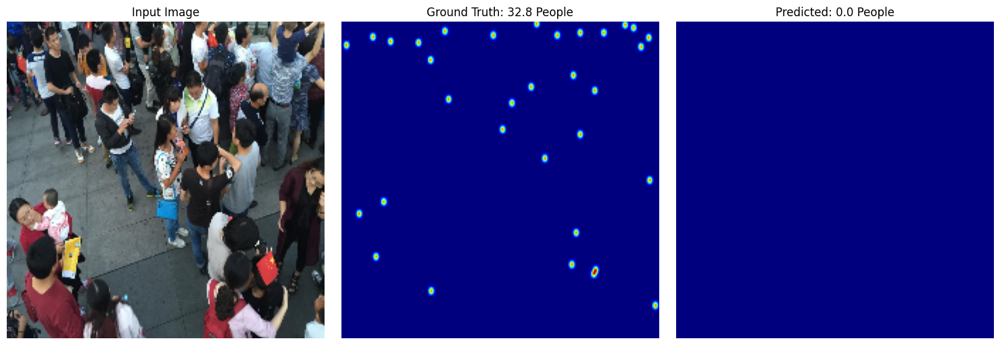

Epoch [10/20] Batch [0/100] Loss: 0.0001 GT counts: [142.27332 157.86182 187.15723  65.97162] Pred counts: [0. 0. 0. 0.]
Epoch [10/20] Batch [10/100] Loss: 0.0001 GT counts: [216.9602   87.90835  54.07044 140.70578] Pred counts: [0. 0. 0. 0.]
Epoch [10/20] Batch [20/100] Loss: 0.0002 GT counts: [103.01509 281.2705  125.30975 104.66793] Pred counts: [0. 0. 0. 0.]
Epoch [10/20] Batch [30/100] Loss: 0.0004 GT counts: [251.17366 343.77676 177.23189  31.72886] Pred counts: [0. 0. 0. 0.]
Epoch [10/20] Batch [40/100] Loss: 0.0003 GT counts: [ 30.504005 411.1599    86.08925   29.832947] Pred counts: [0. 0. 0. 0.]
Epoch [10/20] Batch [50/100] Loss: 0.0005 GT counts: [298.45227 396.53613 180.76338  61.45208] Pred counts: [0. 0. 0. 0.]
Epoch [10/20] Batch [60/100] Loss: 0.0001 GT counts: [ 68.62882 187.00049  11.27724 112.21522] Pred counts: [0. 0. 0. 0.]
Epoch [10/20] Batch [70/100] Loss: 0.0001 GT counts: [ 32.835396 144.92195   85.43908   24.979347] Pred counts: [0. 0. 0. 0.]
Epoch [10/20] Bat

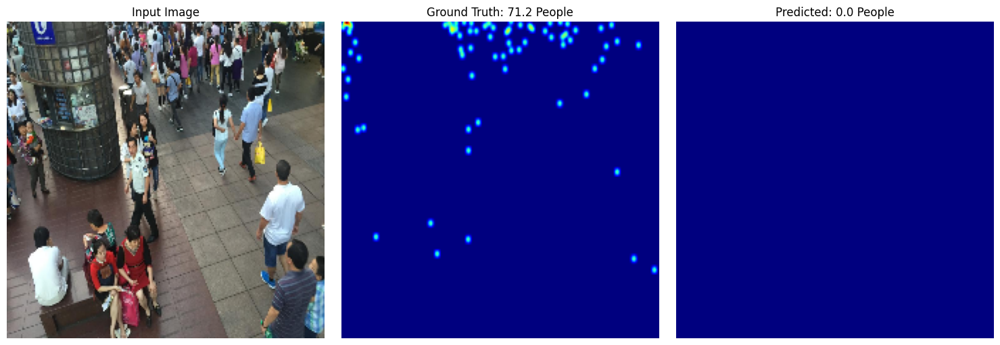

Epoch [11/20] Batch [0/100] Loss: 0.0003 GT counts: [171.6222   42.83293 298.9778   27.58148] Pred counts: [0. 0. 0. 0.]
Epoch [11/20] Batch [10/100] Loss: 0.0002 GT counts: [190.01689   44.782837  24.577068 247.25981 ] Pred counts: [0. 0. 0. 0.]
Epoch [11/20] Batch [20/100] Loss: 0.0001 GT counts: [164.5391    63.80256   78.909775  62.6911  ] Pred counts: [0. 0. 0. 0.]
Epoch [11/20] Batch [30/100] Loss: 0.0003 GT counts: [343.77676   86.026886 146.34744  128.76726 ] Pred counts: [0. 0. 0. 0.]
Epoch [11/20] Batch [40/100] Loss: 0.0001 GT counts: [102.70456   89.65859   75.02719   29.229736] Pred counts: [0. 0. 0. 0.]
Epoch [11/20] Batch [50/100] Loss: 0.0001 GT counts: [246.11453  25.45154  43.88151  93.19748] Pred counts: [0. 0. 0. 0.]
Epoch [11/20] Batch [60/100] Loss: 0.0001 GT counts: [ 97.81622   86.706665 139.7425    19.784153] Pred counts: [0. 0. 0. 0.]
Epoch [11/20] Batch [70/100] Loss: 0.0001 GT counts: [157.87247   29.500172  92.934616  26.47157 ] Pred counts: [0. 0. 0. 0.]
E

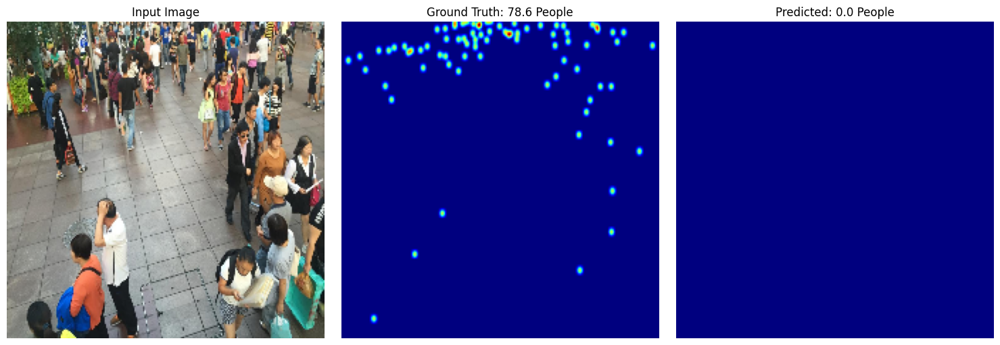

Epoch [12/20] Batch [0/100] Loss: 0.0001 GT counts: [154.74982   26.12001   51.84948   26.035862] Pred counts: [0. 0. 0. 0.]
Epoch [12/20] Batch [10/100] Loss: 0.0001 GT counts: [165.72232   83.11659   91.587524  27.673243] Pred counts: [0. 0. 0. 0.]
Epoch [12/20] Batch [20/100] Loss: 0.0002 GT counts: [ 79.484535  49.602623 342.60635   32.704117] Pred counts: [0. 0. 0. 0.]
Epoch [12/20] Batch [30/100] Loss: 0.0001 GT counts: [155.72888   56.600555  23.78613  163.20769 ] Pred counts: [0. 0. 0. 0.]
Epoch [12/20] Batch [40/100] Loss: 0.0001 GT counts: [ 65.97162  71.16208  85.43908 200.55695] Pred counts: [0. 0. 0. 0.]
Epoch [12/20] Batch [50/100] Loss: 0.0001 GT counts: [ 26.47157 152.0261   44.09287 170.30629] Pred counts: [0. 0. 0. 0.]
Epoch [12/20] Batch [60/100] Loss: 0.0001 GT counts: [187.15723  63.41345  97.0932   69.52156] Pred counts: [0. 0. 0. 0.]
Epoch [12/20] Batch [70/100] Loss: 0.0001 GT counts: [ 21.742722 188.79764   94.8983   123.27171 ] Pred counts: [0. 0. 0. 0.]
Epoch

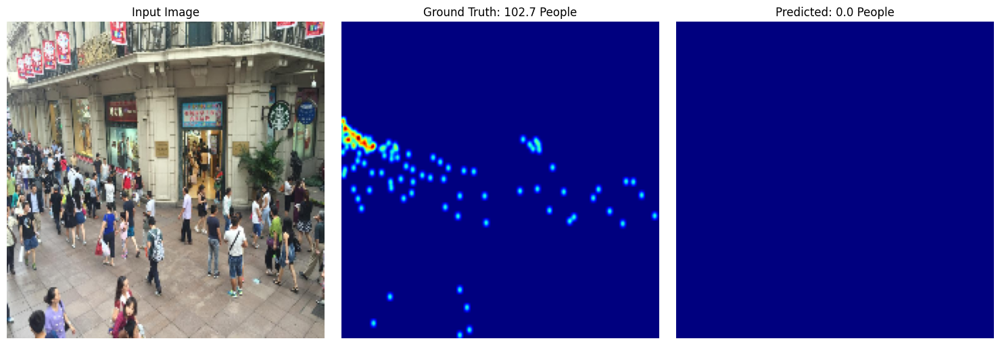

Epoch [13/20] Batch [0/100] Loss: 0.0001 GT counts: [ 53.475357  49.684593 108.21273   75.07878 ] Pred counts: [0. 0. 0. 0.]
Epoch [13/20] Batch [10/100] Loss: 0.0001 GT counts: [ 86.22946  116.870384  49.602623 100.68945 ] Pred counts: [0. 0. 0. 0.]
Epoch [13/20] Batch [20/100] Loss: 0.0002 GT counts: [ 79.76195 247.25981 113.23535 187.48203] Pred counts: [0. 0. 0. 0.]
Epoch [13/20] Batch [30/100] Loss: 0.0002 GT counts: [ 88.309265 251.17271   53.5202    31.728863] Pred counts: [0. 0. 0. 0.]
Epoch [13/20] Batch [40/100] Loss: 0.0001 GT counts: [ 34.46187   14.836905 144.09352   70.98213 ] Pred counts: [0. 0. 0. 0.]
Epoch [13/20] Batch [50/100] Loss: 0.0002 GT counts: [ 72.34978  71.16208  86.46951 273.2558 ] Pred counts: [0. 0. 0. 0.]
Epoch [13/20] Batch [60/100] Loss: 0.0004 GT counts: [144.74026  42.82222 396.53613 262.33212] Pred counts: [0. 0. 0. 0.]
Epoch [13/20] Batch [70/100] Loss: 0.0002 GT counts: [ 66.38849   94.74024   93.216156 333.91168 ] Pred counts: [0. 0. 0. 0.]
Epoch

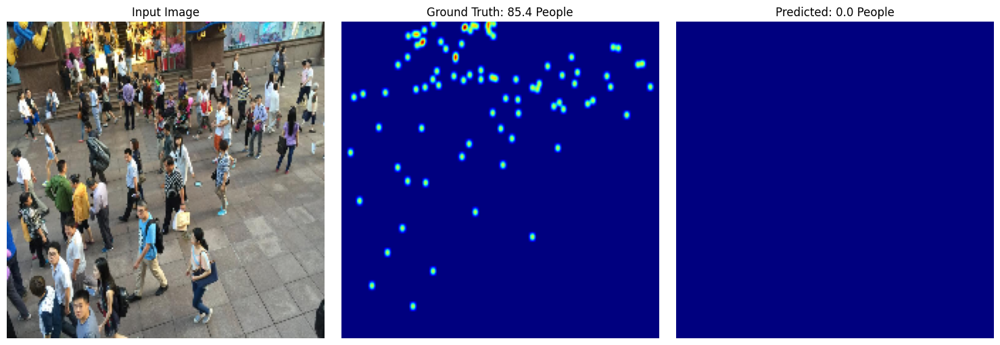

Epoch [14/20] Batch [0/100] Loss: 0.0003 GT counts: [ 29.832947 228.36845  343.77676  165.72232 ] Pred counts: [0. 0. 0. 0.]
Epoch [14/20] Batch [10/100] Loss: 0.0001 GT counts: [ 45.66834   88.309265 149.09106   34.46187 ] Pred counts: [0. 0. 0. 0.]
Epoch [14/20] Batch [20/100] Loss: 0.0005 GT counts: [555.77905 122.41255 130.38855  82.34194] Pred counts: [0. 0. 0. 0.]
Epoch [14/20] Batch [30/100] Loss: 0.0001 GT counts: [144.92195 139.7425   69.3712   92.35977] Pred counts: [0. 0. 0. 0.]
Epoch [14/20] Batch [40/100] Loss: 0.0001 GT counts: [105.29033   22.643677 128.76726  105.79604 ] Pred counts: [0. 0. 0. 0.]
Epoch [14/20] Batch [50/100] Loss: 0.0001 GT counts: [26.12001  36.489258 97.0932   79.484535] Pred counts: [0. 0. 0. 0.]
Epoch [14/20] Batch [60/100] Loss: 0.0004 GT counts: [166.7854 160.6897 367.5888 152.0261] Pred counts: [0. 0. 0. 0.]
Epoch [14/20] Batch [70/100] Loss: 0.0001 GT counts: [104.7269   131.03386  105.79193   40.237076] Pred counts: [0. 0. 0. 0.]
Epoch [14/20]

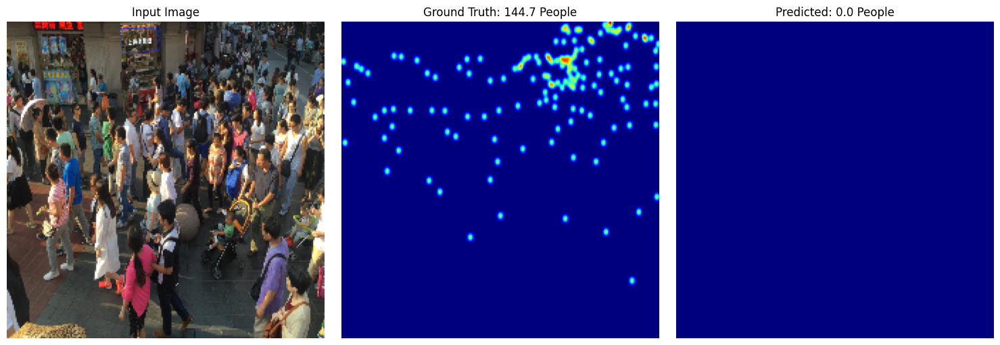

Epoch [15/20] Batch [0/100] Loss: 0.0001 GT counts: [26.719517 92.934616 64.46525  60.874817] Pred counts: [0. 0. 0. 0.]
Epoch [15/20] Batch [10/100] Loss: 0.0002 GT counts: [228.36845 149.09106  23.       82.34194] Pred counts: [0. 0. 0. 0.]
Epoch [15/20] Batch [20/100] Loss: 0.0001 GT counts: [190.01689   29.500172  79.484535 158.88716 ] Pred counts: [0. 0. 0. 0.]
Epoch [15/20] Batch [30/100] Loss: 0.0002 GT counts: [151.68369   33.061234 232.46078   44.782837] Pred counts: [0. 0. 0. 0.]
Epoch [15/20] Batch [40/100] Loss: 0.0002 GT counts: [ 76.18249 209.11908 165.72232 135.3774 ] Pred counts: [0. 0. 0. 0.]
Epoch [15/20] Batch [50/100] Loss: 0.0003 GT counts: [ 40.902176 149.7842   343.74368   26.12001 ] Pred counts: [0. 0. 0. 0.]
Epoch [15/20] Batch [60/100] Loss: 0.0001 GT counts: [75.07878 83.28371 94.74024 89.65859] Pred counts: [0. 0. 0. 0.]
Epoch [15/20] Batch [70/100] Loss: 0.0001 GT counts: [162.97649   20.638638 210.99995   23.78613 ] Pred counts: [0. 0. 0. 0.]
Epoch [15/20]

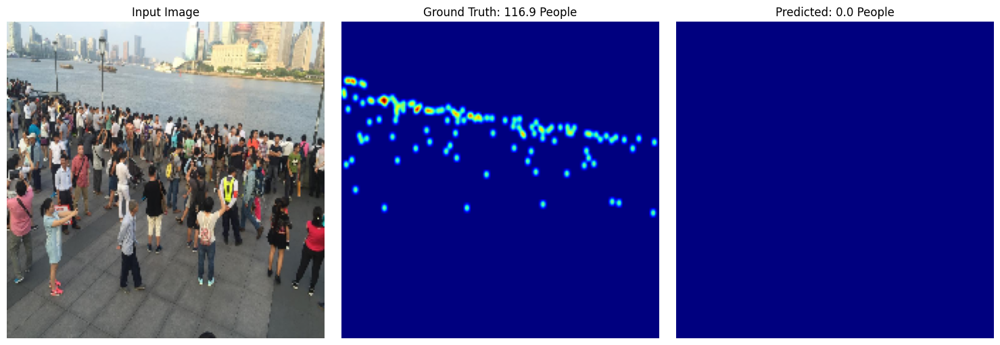

Epoch [16/20] Batch [0/100] Loss: 0.0004 GT counts: [295.96805   81.385376 367.5888   187.00049 ] Pred counts: [0. 0. 0. 0.]
Epoch [16/20] Batch [10/100] Loss: 0.0005 GT counts: [ 48.567547 507.13916   60.874817 136.82718 ] Pred counts: [0. 0. 0. 0.]
Epoch [16/20] Batch [20/100] Loss: 0.0001 GT counts: [112.64365   67.660736 150.92142   32.704117] Pred counts: [0. 0. 0. 0.]
Epoch [16/20] Batch [30/100] Loss: 0.0002 GT counts: [146.34744   92.63733  152.0261    45.752422] Pred counts: [0. 0. 0. 0.]
Epoch [16/20] Batch [40/100] Loss: 0.0001 GT counts: [ 82.47809  23.      103.01509 209.84383] Pred counts: [0. 0. 0. 0.]
Epoch [16/20] Batch [50/100] Loss: 0.0003 GT counts: [ 79.513016  32.26191   59.09206  343.74368 ] Pred counts: [0. 0. 0. 0.]
Epoch [16/20] Batch [60/100] Loss: 0.0001 GT counts: [ 61.39896  76.18249 149.7842  130.8227 ] Pred counts: [0. 0. 0. 0.]
Epoch [16/20] Batch [70/100] Loss: 0.0000 GT counts: [104.65788   34.941895  11.832941  48.78608 ] Pred counts: [0. 0. 0. 0.]
E

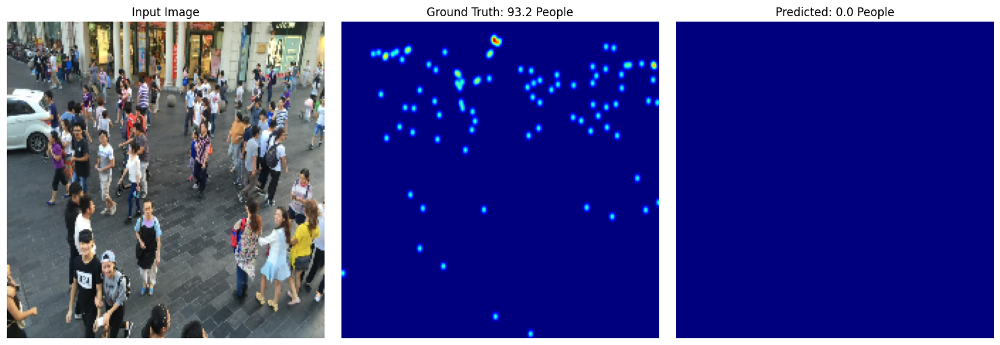

Epoch [17/20] Batch [0/100] Loss: 0.0003 GT counts: [123.45852   30.504005 367.5888    86.026886] Pred counts: [0. 0. 0. 0.]
Epoch [17/20] Batch [10/100] Loss: 0.0001 GT counts: [151.68369   35.000004  87.90835  111.4709  ] Pred counts: [0. 0. 0. 0.]
Epoch [17/20] Batch [20/100] Loss: 0.0001 GT counts: [ 11.832941  35.667934 117.69616  165.72232 ] Pred counts: [0. 0. 0. 0.]
Epoch [17/20] Batch [30/100] Loss: 0.0001 GT counts: [ 26.719517 128.39958   86.770645 163.20769 ] Pred counts: [0. 0. 0. 0.]
Epoch [17/20] Batch [40/100] Loss: 0.0001 GT counts: [177.23189  54.07044  56.60124 187.15723] Pred counts: [0. 0. 0. 0.]
Epoch [17/20] Batch [50/100] Loss: 0.0002 GT counts: [131.03386 197.61705 231.87375 131.60263] Pred counts: [0. 0. 0. 0.]
Epoch [17/20] Batch [60/100] Loss: 0.0000 GT counts: [ 22.432156  36.489258 104.65788   47.50782 ] Pred counts: [0. 0. 0. 0.]
Epoch [17/20] Batch [70/100] Loss: 0.0001 GT counts: [ 17.934093 167.64783   26.59269  161.76189 ] Pred counts: [0. 0. 0. 0.]
E

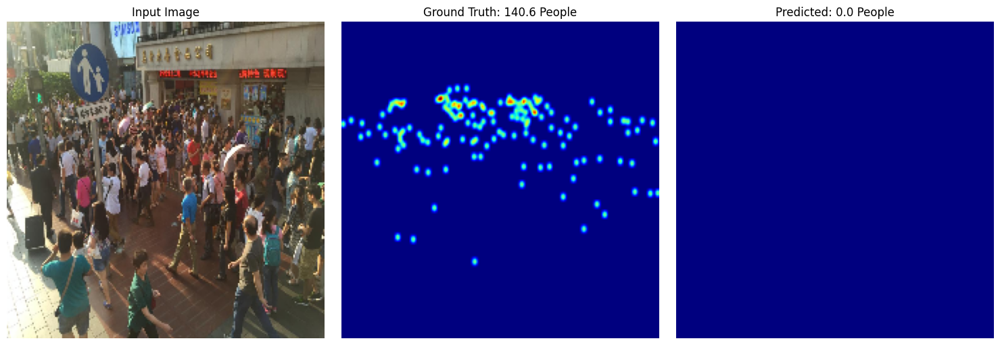

Epoch [18/20] Batch [0/100] Loss: 0.0001 GT counts: [ 29.832947 132.27592   28.347343  31.728863] Pred counts: [0. 0. 0. 0.]
Epoch [18/20] Batch [10/100] Loss: 0.0002 GT counts: [ 52.55664 179.0563  115.70012 242.09637] Pred counts: [0. 0. 0. 0.]
Epoch [18/20] Batch [20/100] Loss: 0.0001 GT counts: [ 27.673243  47.50782   44.09287  106.533844] Pred counts: [0. 0. 0. 0.]
Epoch [18/20] Batch [30/100] Loss: 0.0002 GT counts: [ 84.48572  279.29944  123.410545  88.309265] Pred counts: [0. 0. 0. 0.]
Epoch [18/20] Batch [40/100] Loss: 0.0001 GT counts: [105.84036  187.48203   25.45154   41.106064] Pred counts: [0. 0. 0. 0.]
Epoch [18/20] Batch [50/100] Loss: 0.0005 GT counts: [557.69257  63.41345 106.60312  86.08925] Pred counts: [0. 0. 0. 0.]
Epoch [18/20] Batch [60/100] Loss: 0.0002 GT counts: [262.33212  62.6911   89.65859  85.43908] Pred counts: [0. 0. 0. 0.]
Epoch [18/20] Batch [70/100] Loss: 0.0001 GT counts: [ 40.237076 234.59068   76.478485  29.500172] Pred counts: [0. 0. 0. 0.]
Epoch

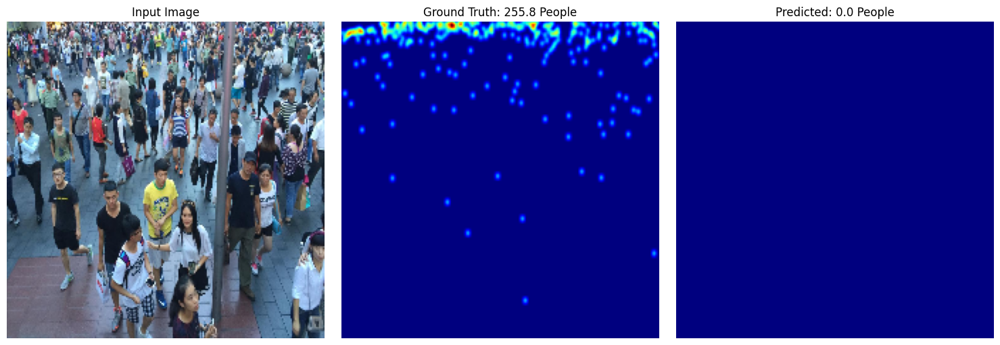

Epoch [19/20] Batch [0/100] Loss: 0.0005 GT counts: [ 24.577068 158.88716  555.77905   26.719517] Pred counts: [0. 0. 0. 0.]
Epoch [19/20] Batch [10/100] Loss: 0.0002 GT counts: [ 86.22612 273.2558  180.32423  97.81622] Pred counts: [0. 0. 0. 0.]
Epoch [19/20] Batch [20/100] Loss: 0.0001 GT counts: [ 82.34194   49.602623 177.23189  163.20769 ] Pred counts: [0. 0. 0. 0.]
Epoch [19/20] Batch [30/100] Loss: 0.0001 GT counts: [113.37622   52.66703  116.65566   79.484535] Pred counts: [0. 0. 0. 0.]
Epoch [19/20] Batch [40/100] Loss: 0.0001 GT counts: [105.71296 190.01689  41.96058  92.63733] Pred counts: [0. 0. 0. 0.]
Epoch [19/20] Batch [50/100] Loss: 0.0002 GT counts: [343.77676   26.781643  36.367462  25.279913] Pred counts: [0. 0. 0. 0.]
Epoch [19/20] Batch [60/100] Loss: 0.0007 GT counts: [ 66.409325 343.74368   32.835396 507.13916 ] Pred counts: [0. 0. 0. 0.]
Epoch [19/20] Batch [70/100] Loss: 0.0002 GT counts: [129.58394  166.7854    58.510963 123.45852 ] Pred counts: [0. 0. 0. 0.]
E

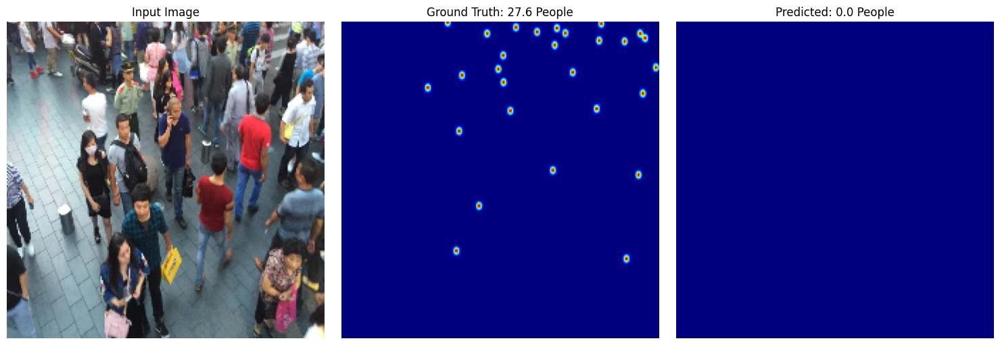

Epoch [20/20] Batch [0/100] Loss: 0.0003 GT counts: [200.06914 342.60635  85.43908 256.0014 ] Pred counts: [0. 0. 0. 0.]
Epoch [20/20] Batch [10/100] Loss: 0.0000 GT counts: [115.61615   42.82222   49.602623  15.51301 ] Pred counts: [0. 0. 0. 0.]
Epoch [20/20] Batch [20/100] Loss: 0.0001 GT counts: [ 27.673243  29.58704  177.23189   45.752422] Pred counts: [0. 0. 0. 0.]
Epoch [20/20] Batch [30/100] Loss: 0.0001 GT counts: [ 28.599224 172.86972   66.173706  86.22612 ] Pred counts: [0. 0. 0. 0.]
Epoch [20/20] Batch [40/100] Loss: 0.0002 GT counts: [ 86.46951  295.96805   53.5202    67.660736] Pred counts: [0. 0. 0. 0.]
Epoch [20/20] Batch [50/100] Loss: 0.0003 GT counts: [ 57.624695 281.2705   261.3097   187.48203 ] Pred counts: [0. 0. 0. 0.]
Epoch [20/20] Batch [60/100] Loss: 0.0004 GT counts: [ 82.47809  345.10327   22.909779 348.89456 ] Pred counts: [0. 0. 0. 0.]
Epoch [20/20] Batch [70/100] Loss: 0.0001 GT counts: [145.56155   20.638638  24.979347 136.82718 ] Pred counts: [0. 0. 0. 0

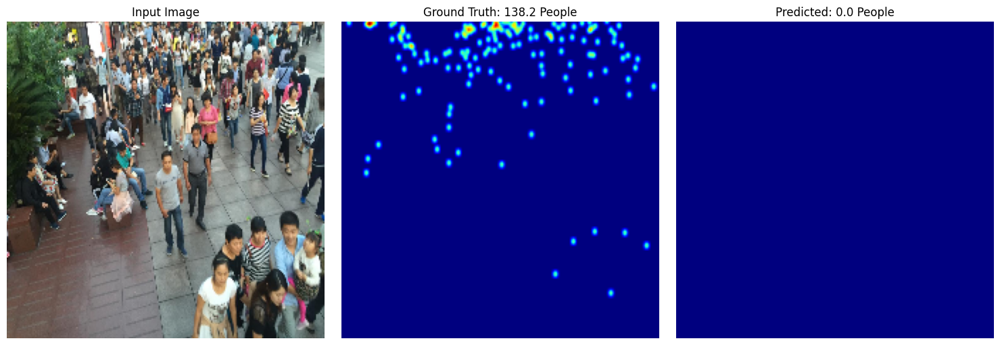

Training complete.


In [33]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from scipy.io import loadmat
from PIL import Image
import matplotlib.pyplot as plt

# ----------- MCNN Model -----------
class MCNN(nn.Module):
    def __init__(self):
        super(MCNN, self).__init__()
        self.branch1 = nn.Sequential(
            nn.Conv2d(3, 16, 9, padding=4), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(16, 32, 7, padding=3), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 16, 7, padding=3), nn.ReLU(),
            nn.Conv2d(16, 8, 7, padding=3), nn.ReLU()
        )
        self.branch2 = nn.Sequential(
            nn.Conv2d(3, 20, 7, padding=3), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(20, 40, 5, padding=2), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(40, 20, 5, padding=2), nn.ReLU(),
            nn.Conv2d(20, 10, 5, padding=2), nn.ReLU()
        )
        self.branch3 = nn.Sequential(
            nn.Conv2d(3, 24, 5, padding=2), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(24, 48, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(48, 24, 3, padding=1), nn.ReLU(),
            nn.Conv2d(24, 12, 3, padding=1), nn.ReLU()
        )
        self.fuse = nn.Conv2d(8 + 10 + 12, 1, 1)

    def forward(self, x):
        x1 = self.branch1(x)
        x2 = self.branch2(x)
        x3 = self.branch3(x)
        out = torch.cat((x1, x2, x3), dim=1)
        out = self.fuse(out)
        return torch.clamp(out, min=0)  # Ensure non-negative predictions

# ----------- Dataset -----------
class ShanghaiTechCrowdCountingDataset(Dataset):
    def __init__(self, image_dir, gt_dir, transform=None, img_size=(224, 224)):
        self.image_dir = image_dir
        self.gt_dir = gt_dir
        self.transform = transform
        self.img_size = img_size
        self.image_files = sorted(os.listdir(image_dir))
        self.gt_files = sorted(os.listdir(gt_dir))

    def __len__(self):
        return len(self.image_files)

    def generate_density_map(self, img, coordinates):
        density_map = np.zeros(img.shape[:2], dtype=np.float32)
        kernel_size = 25
        sigma = 6.0
        gaussian_kernel = self.create_gaussian_kernel(kernel_size, sigma)
        half_k = kernel_size // 2

        for coord in coordinates:
            x, y = int(coord[0]), int(coord[1])

            # Boundaries for image slice
            x_min = max(x - half_k, 0)
            y_min = max(y - half_k, 0)
            x_max = min(x + half_k + 1, img.shape[1])
            y_max = min(y + half_k + 1, img.shape[0])

            # Compute the valid size of the slice
            img_w = x_max - x_min
            img_h = y_max - y_min

            if img_w <= 0 or img_h <= 0:
                # Skip invalid coordinate (outside image)
                continue

            # Boundaries for kernel slice
            g_x_min = half_k - (x - x_min)
            g_y_min = half_k - (y - y_min)
            g_x_max = g_x_min + img_w
            g_y_max = g_y_min + img_h

            # Sanity check to ensure slices have same shape
            if (g_y_max - g_y_min) != img_h or (g_x_max - g_x_min) != img_w:
                # If mismatch, skip to avoid errors
                continue

            density_map[y_min:y_max, x_min:x_max] += gaussian_kernel[g_y_min:g_y_max, g_x_min:g_x_max]

        return np.clip(density_map, 0, None)


    def create_gaussian_kernel(self, kernel_size, sigma):
        ax = np.linspace(-(kernel_size // 2), kernel_size // 2, kernel_size)
        xx, yy = np.meshgrid(ax, ax)
        kernel = np.exp(-(xx ** 2 + yy ** 2) / (2 * sigma ** 2))
        return kernel / np.sum(kernel)

    def __getitem__(self, idx):
        image_path = os.path.join(self.image_dir, self.image_files[idx])
        gt_path = os.path.join(self.gt_dir, self.gt_files[idx])
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mat_data = loadmat(gt_path)
        coordinates = mat_data['image_info'][0, 0]['location'][0, 0]

        density_map = self.generate_density_map(image, coordinates)
        original_sum = density_map.sum()

        # Resize images and density map to fixed size
        image_resized = cv2.resize(image, self.img_size)
        density_map_resized = cv2.resize(density_map, self.img_size)

        # Scale density map so sum stays the same after resizing
        if density_map_resized.sum() > 0:
            density_map_resized = density_map_resized * (original_sum / (density_map_resized.sum() + 1e-12))

        image_pil = Image.fromarray(image_resized)
        if self.transform:
            image_pil = self.transform(image_pil)

        density_map_tensor = torch.tensor(density_map_resized, dtype=torch.float32).unsqueeze(0)
        return image_pil, density_map_tensor

# ----------- Setup -----------
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

train_dataset = ShanghaiTechCrowdCountingDataset(
    image_dir='ShanghaiTech/part_B_final/train_data/images',
    gt_dir='ShanghaiTech/part_B_final/train_data/ground_truth',
    transform=transform,
    img_size=(224, 224)
)
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)

# ----------- Utility Functions -----------
def count_people_from_density(density_map):
    return float(density_map.sum().item())

def plot(img, gt, pred):
    # Resize pred to gt size for visualization
    pred_resized = F.interpolate(pred.unsqueeze(0), size=gt.shape[1:], mode='bilinear', align_corners=False).squeeze(0)
    pred_resized = pred_resized.cpu().numpy()

    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    img_np = img.cpu().permute(1, 2, 0).numpy()
    # Undo normalization for visualization
    img_np = img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    img_np = np.clip(img_np, 0, 1)
    plt.imshow(img_np)
    plt.title("Input Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(gt.squeeze().cpu(), cmap='jet')
    plt.title(f"Ground Truth: {gt.sum().item():.1f} People")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(pred_resized.squeeze(), cmap='jet')
    plt.title(f"Predicted: {pred_resized.sum():.1f} People")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# ----------- Training -----------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MCNN().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)  # higher lr

num_epochs = 20

for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    for batch_idx, (imgs, gt_maps) in enumerate(train_loader):
        imgs, gt_maps = imgs.to(device), gt_maps.to(device)
        preds = model(imgs)

        # Upsample preds to gt_map size before loss calculation
        if preds.shape[2:] != gt_maps.shape[2:]:
            preds = F.interpolate(preds, size=gt_maps.shape[2:], mode='bilinear', align_corners=False)

        loss = criterion(preds, gt_maps)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        # Print batch counts for debugging
        if batch_idx % 10 == 0:
            gt_counts = gt_maps.view(gt_maps.size(0), -1).sum(dim=1)
            pred_counts = preds.view(preds.size(0), -1).sum(dim=1).detach()
            print(f"Epoch [{epoch+1}/{num_epochs}] Batch [{batch_idx}/{len(train_loader)}] "
                  f"Loss: {loss.item():.4f} GT counts: {gt_counts.cpu().numpy()} Pred counts: {pred_counts.cpu().numpy()}")

    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1} average loss: {avg_loss:.4f}")

    # Plot a sample result every epoch
    model.eval()
    with torch.no_grad():
        sample_img, sample_gt = next(iter(train_loader))
        sample_img, sample_gt = sample_img.to(device), sample_gt.to(device)
        pred_map = model(sample_img)
        if pred_map.shape[2:] != sample_gt.shape[2:]:
            pred_map = F.interpolate(pred_map, size=sample_gt.shape[2:], mode='bilinear', align_corners=False)
        plot(sample_img[0], sample_gt[0], pred_map[0])

print("Training complete.")
